In [1]:
from google.colab import drive

# Mount Google Drive
drive.mount(r'/content/gdrive',force_remount=True)

Mounted at /content/gdrive


In [2]:
#drive.flush_and_unmount()

In [3]:
path_to_add=r'/content/drive/MyDrive/Ninjacart_cv'
FILE_ID="1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT"

In [4]:
import os
os.chdir("/content/gdrive/MyDrive/Ninjacart_cv/")
os.getcwd()

'/content/gdrive/MyDrive/Ninjacart_cv'

In [5]:
!pip install --upgrade tensorflow

### Problem Statement
##### Ninjacart, India's largest fresh produce supply chain company, aims to develop an automated system for classifying vegetables in market images. The goal is to build a robust multiclass classifier capable of distinguishing between onions, potatoes, tomatoes, and general market scenes (noise). This will aid in streamlining inventory management and quality control using computer vision techniques.



In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from datetime import datetime,timedelta
import warnings
warnings.filterwarnings('ignore')
from collections import Counter
import time
import re
import pickle
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy import stats
import itertools
import os
from numpy.linalg import norm
from tqdm import tqdm, tqdm_notebook
import math
import tensorflow as tf
import seaborn as sns
import matplotlib.cm as cm
import shutil
import glob
import random
import cv2
from IPython.display import display

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [7]:
!rm -rf data/
!mkdir -p data
!pip install gdown
!gdown --fuzzy "https://drive.google.com/file/d/1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT/view?usp=sharing" --output data/ninjacart.zip
!unzip data/ninjacart.zip -d data/
!rm -rf data/ninjacart.zip

Downloading...
From (original): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
From (redirected): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT&confirm=t&uuid=76c525f5-c300-419f-81e1-054bac88b6d6
To: /content/gdrive/MyDrive/Ninjacart_cv/data/ninjacart.zip
100% 275M/275M [00:05<00:00, 51.9MB/s]
Archive:  data/ninjacart.zip
   creating: data/ninjacart_data/test/
   creating: data/ninjacart_data/test/indian market/
  inflating: data/ninjacart_data/test/indian market/bhl.jpeg  
  inflating: data/ninjacart_data/test/indian market/bhv.jpeg  
  inflating: data/ninjacart_data/test/indian market/bn.jpeg  
  inflating: data/ninjacart_data/test/indian market/hjx.jpeg  
  inflating: data/ninjacart_data/test/indian market/igis.jpeg  
  inflating: data/ninjacart_data/test/indian market/in.jpeg  
  inflating: data/ninjacart_data/test/indian market/india-4898453__340.jpg  
  inflating: data/ninjacart_data/test/indian market/indianmarket10.jpeg  
  inflating: data/n

In [8]:
# Reset any previous TPU configurations:
try:
  tf.config.experimental_connect_to_cluster(None)
  tf.tpu.experimental.initialize_tpu_system(None)
except:
  pass

# Explicitly set strategy to use a specific device:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
    print('Running on TPU ', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
    print("TPU initialized and strategy set.")
except ValueError:
    tpu = None
    strategy = tf.distribute.MirroredStrategy()  # Use for GPUs or CPUs
    print("Using MirroredStrategy for CPUs/GPUs.")



print("Number of replicas:", strategy.num_replicas_in_sync)

Running on TPU  
TPU initialized and strategy set.
Number of replicas: 8


In [9]:
AUTOTUNE = tf.data.AUTOTUNE

BATCH_SIZE = 16 * strategy.num_replicas_in_sync

IMAGE_SIZE =(224, 224)

CLASS_NAMES = ["tomato", "potato","onion","indian market"]

idx_to_class={i:j for i,j in enumerate(CLASS_NAMES)}
class_to_idx={j:i for i,j in enumerate(CLASS_NAMES)}


### EDA

Training Set



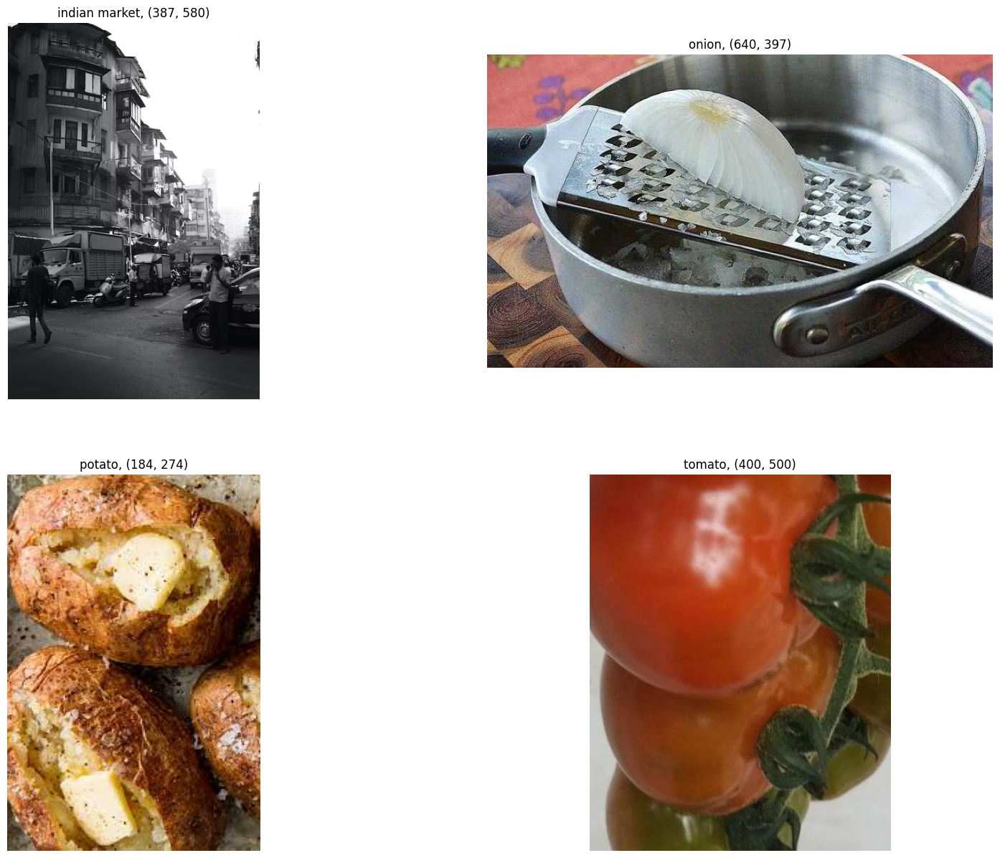

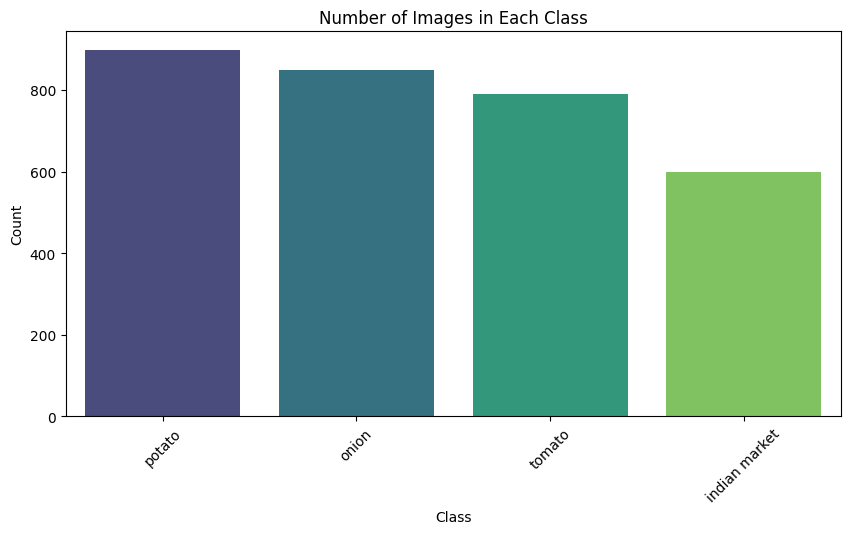

,class,count
0,potato,898
1,onion,849
2,tomato,789
3,indian market,599


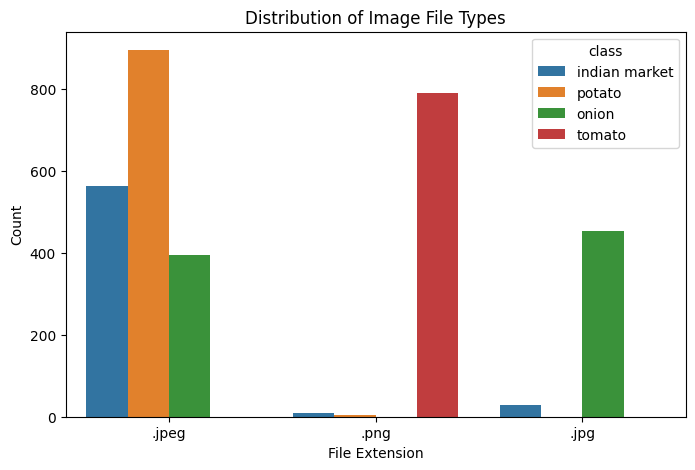

class,indian market,onion,potato,tomato
file_ext,,,,
.jpeg,562,395,895,0
.png,8,0,3,789
.jpg,29,454,0,0


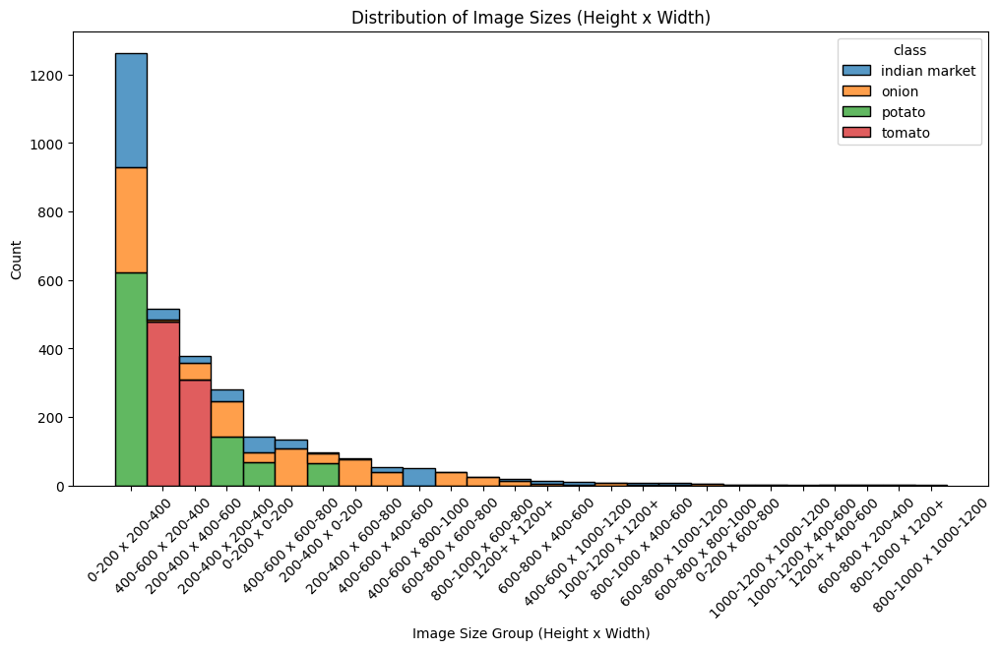

class,indian market,onion,potato,tomato
size_group,,,,
0-200 x 200-400,334,307,623,0
400-600 x 200-400,30,6,0,479
200-400 x 400-600,20,49,0,310
200-400 x 200-400,35,105,141,0
0-200 x 0-200,48,27,68,0
400-600 x 600-800,28,107,0,0
200-400 x 0-200,4,27,66,0
200-400 x 600-800,3,75,0,0
400-600 x 400-600,14,39,0,0


In [11]:
height_bins = [0, 200, 400, 600, 800, 1000, 1200, float("inf")]
width_bins = [0, 200, 400, 600, 800, 1000, 1200, float("inf")]

data_dir = "data/ninjacart_data/train"

def eda_train_test(data_dir):
  train_class_dirs = os.listdir(data_dir)

  # Store image metadata
  image_data = []
  image_dict = {}
  count_dict = {}
  # Loop through class directories
  for cls in train_class_dirs:
      file_paths = glob.glob(f"{data_dir}/{cls}/*")

      count_dict[cls] = len(file_paths)
      image_path = random.choice(file_paths)
      image_dict[cls] = tf.keras.utils.load_img(image_path)

      for file_path in file_paths:
          file_name = os.path.basename(file_path)
          file_ext = os.path.splitext(file_name)[1].lower()  # Get file extension

          # Read image
          img = cv2.imread(file_path)
          if img is not None:
              height, width = img.shape[:2]
              image_data.append([cls, file_path, file_ext, width, height])

  # Convert to DataFrame
  df = pd.DataFrame(image_data, columns=["class", "file_path", "file_ext", "width", "height"])
  df["height_bin"] = pd.cut(df["height"], bins=height_bins, labels=["0-200", "200-400", "400-600", "600-800", "800-1000", "1000-1200", "1200+"])
  df["width_bin"] = pd.cut(df["width"], bins=width_bins, labels=["0-200", "200-400", "400-600", "600-800", "800-1000", "1000-1200", "1200+"])

  # Combine height & width bins for better grouping
  df["size_group"] = df["height_bin"].astype(str) + " x " + df["width_bin"].astype(str)
  # Count the number of images per class
  class_counts = df["class"].value_counts().reset_index()
  class_counts.columns = ["class", "count"]


  plt.figure(figsize=(20, 15))
  for i, (cls,img) in enumerate(image_dict.items()):
      ax = plt.subplot(2, 2, i + 1)
      plt.imshow(img)
      plt.title(f'{cls}, {img.size}')
      plt.axis("off")

  # Plot class distribution
  plt.figure(figsize=(10, 5))
  sns.barplot(data=class_counts, x="class", y="count", palette="viridis")

  plt.title("Number of Images in Each Class")
  plt.xlabel("Class")
  plt.ylabel("Count")
  plt.xticks(rotation=45)
  plt.show()
  display(class_counts)

  # Visualize file type distribution
  plt.figure(figsize=(8, 5))
  i=df.groupby(['file_ext']).file_path.count().sort_values(ascending=False).index
  df["file_ext"] = pd.Categorical(df["file_ext"], categories=list(i), ordered=True)
  df = df.sort_values("file_ext")

  sns.countplot(data=df, x="file_ext", hue="class")
  plt.title("Distribution of Image File Types")
  plt.xlabel("File Extension")
  plt.ylabel("Count")
  plt.show()

  display(df.groupby(['file_ext','class']).file_path.count().unstack().fillna(0).loc[i])

  # Plot distribution of image sizes
  plt.figure(figsize=(12, 6))
  i=df.groupby(['size_group']).file_path.count().sort_values(ascending=False).index
  df["size_group"] = pd.Categorical(df["size_group"], categories=list(i), ordered=True)
  df = df.sort_values("size_group")
  sns.histplot(data=df, x="size_group", hue="class", multiple="stack")
  plt.xticks(rotation=45)
  plt.title("Distribution of Image Sizes (Height x Width)")
  plt.xlabel("Image Size Group (Height x Width)")
  plt.ylabel("Count")
  plt.show()

  display(df.groupby(['size_group','class']).file_path.count().unstack().fillna(0).loc[i])

  df.reset_index(drop=True, inplace=True)
  return df
print("================================================\nTraining Set\n================================================\n")
train_df=eda_train_test(data_dir)

In [12]:
### uneven image sizes

Test Set



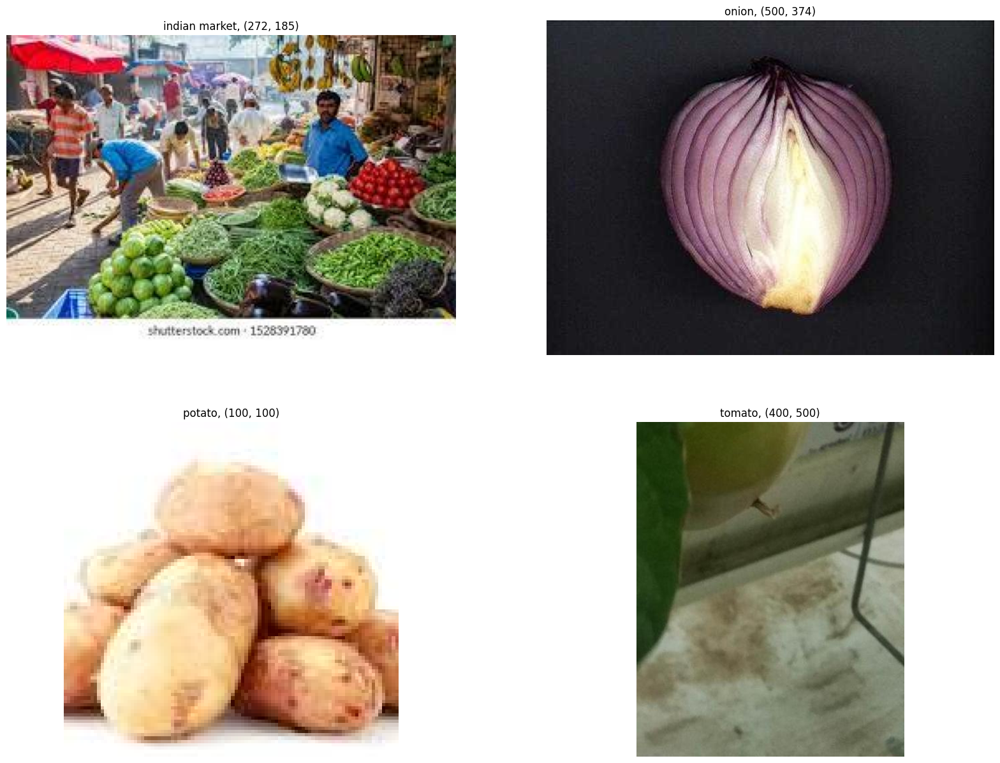

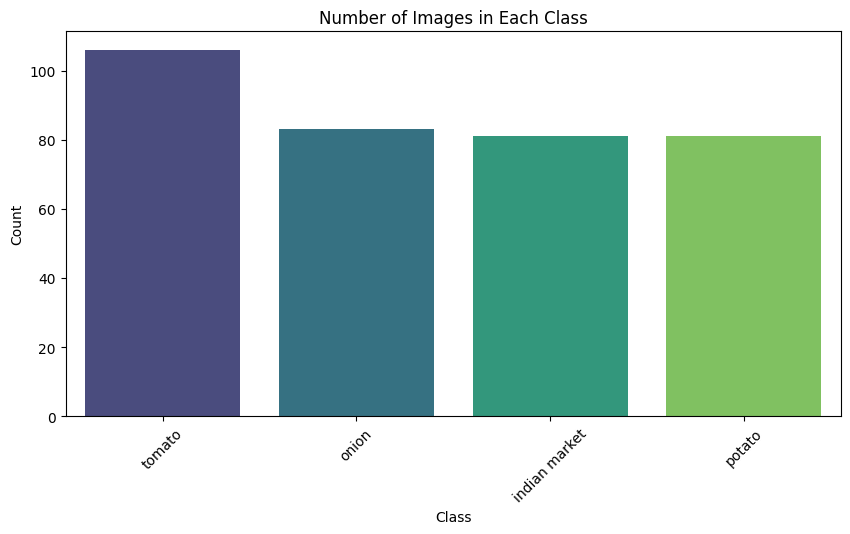

,class,count
0,tomato,106
1,onion,83
2,indian market,81
3,potato,81


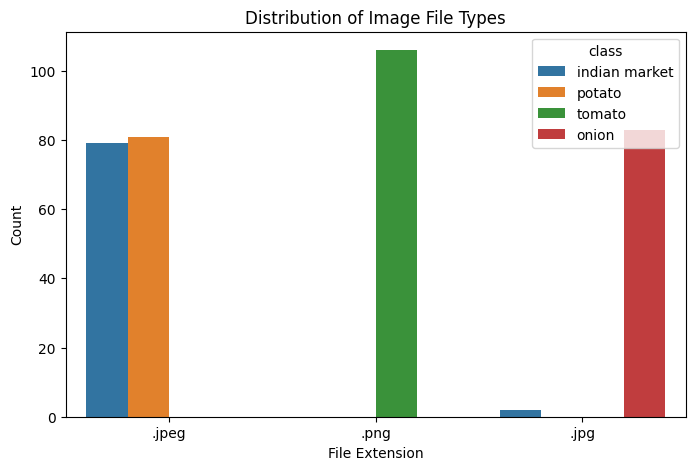

class,indian market,onion,potato,tomato
file_ext,,,,
.jpeg,79,0,81,0
.png,0,0,0,106
.jpg,2,83,0,0


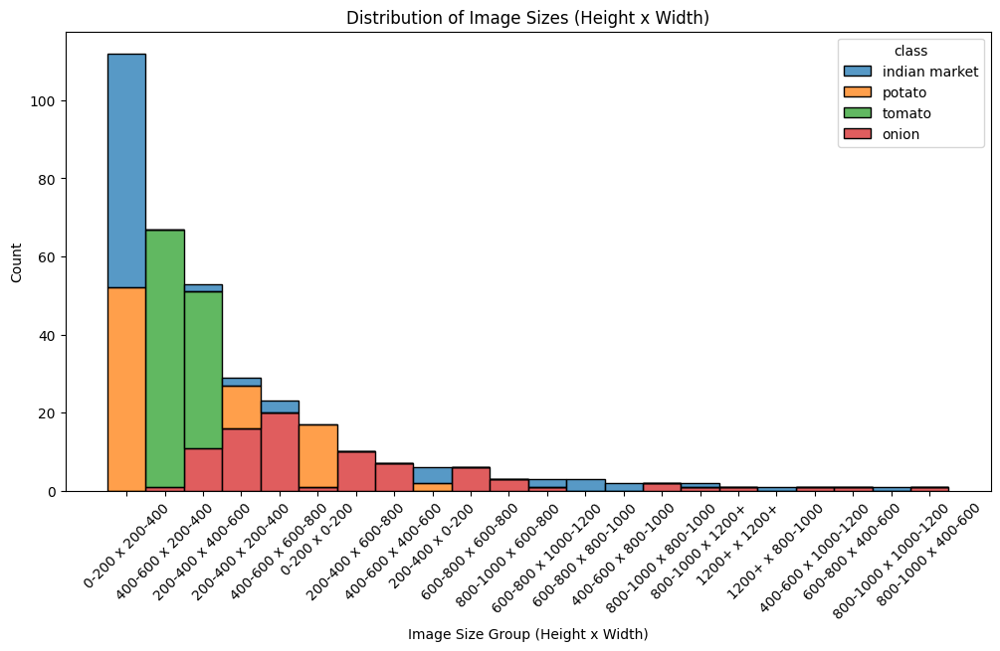

class,indian market,onion,potato,tomato
size_group,,,,
0-200 x 200-400,60,0,52,0
400-600 x 200-400,0,1,0,66
200-400 x 400-600,2,11,0,40
200-400 x 200-400,2,16,11,0
400-600 x 600-800,3,20,0,0
0-200 x 0-200,0,1,16,0
200-400 x 600-800,0,10,0,0
400-600 x 400-600,0,7,0,0
200-400 x 0-200,4,0,2,0


In [13]:
data_dir = "data/ninjacart_data/test"
print("================================================\nTest Set\n================================================\n")
test_df=eda_train_test(data_dir)

### Train and Validation Split

In [14]:
from sklearn.model_selection import train_test_split

def train_test(dd,x_cols,y_col,stratify_col=None):
    d=dd.copy()
    d=d.sample(frac=1,random_state=0)
    random_sample_index_map={i:j for i,j in list(enumerate(list(d.index)))}
    d.reset_index(drop=True,inplace=True)
    xtrain,xtest,ytrain,ytest=train_test_split(d.loc[:,x_cols]
                                               ,d.loc[:,y_col]
                                               ,test_size=0.20  #20% val_size
                                               ,random_state=0,stratify=stratify_col)
    return xtrain,xtest,ytrain,ytest,random_sample_index_map


train_df,val_df,_,_,_=train_test(train_df,train_df.columns,'class',train_df['class'])

In [15]:
train_df.reset_index(drop=True,inplace=True)
val_df.reset_index(drop=True,inplace=True)

print('Train Image counts: {}'.format(len(train_df)))
print('Validation Image counts: {}'.format(len(val_df)))
print('Test Image counts: {}'.format(len(test_df)))

Train Image counts: 2508
Validation Image counts: 627
Test Image counts: 351


In [16]:
## Training data size is too low.. we can only add last softmax layer to the models

#### Preparing Batches and Data Augmentation

In [17]:
#add augmented images to balance the dataset
train_df["label"] = train_df["class"].map(class_to_idx)
class_counts = train_df["label"].value_counts().to_dict()
max_class_size = max(class_counts.values())  # Maximum number of samples in any class
num_classes=len(class_counts)

def filter_and_sample_augmented_ds(aug_ds, required_counts):
    """Filters and samples the augmented dataset to balance classes."""
    sampled_datasets = []

    for class_label, count in required_counts.items():
        class_ds = aug_ds.filter(lambda img, label: tf.equal(label, class_label))
        class_ds = class_ds.take(count)  # Take required samples per class
        sampled_datasets.append(class_ds)

    return sampled_datasets

required_aug_counts = {label: max_class_size - count for label, count in class_counts.items()}


In [18]:
required_aug_counts

{1: 0, 2: 60, 0: 116, 3: 252}

In [19]:

## Preprocessing the Images and Augmenting Train Images
def augment_image(img, label):
    img = tf.image.resize(img, (400, 400))  # Resize to 400x400
    img = tf.image.random_crop(img, size=[224, 224, 3])  # Random crop to 224x224
    img = tf.image.random_flip_left_right(img)  # Random horizontal flip
    img = tf.image.random_brightness(img, max_delta=0.2)  # Random brightness change
    img = tf.image.random_contrast(img, lower=0.8, upper=1.2)  # Random contrast change

    return img, label

def load_image(image_path, label):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)  # Change to decode_png if using PNG images
    return img, label

def normalize_image(img, label):
    img = tf.image.resize(img, IMAGE_SIZE)  # Resize to match model input size
    img = img / 255.0  # Normalize pixel values to [0, 1]
    img = tf.clip_by_value(img, 0.0, 1.0)
    return img, label

def preprocess_data(train_df):
  # Map labels to numerical values
  train_df["label"] = train_df["class"].map(class_to_idx)

  # Convert to lists
  image_paths = train_df["file_path"].tolist()
  labels = train_df["label"].tolist()

  # Create a TensorFlow dataset
  train_ds = tf.data.Dataset.from_tensor_slices((image_paths, labels))

  # Map the dataset to load images
  train_ds = train_ds.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
  return train_ds, train_df

train_ds, train_df = preprocess_data(train_df)
val_ds, val_df = preprocess_data(val_df)
test_ds, test_df = preprocess_data(test_df)

t_ds = train_ds.map(lambda img, label: (img, label))  #making a copy
augmented_train_ds = t_ds.map(augment_image, num_parallel_calls=tf.data.AUTOTUNE)
augmented_train_ds = augmented_train_ds.map(normalize_image, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.map(normalize_image, num_parallel_calls=tf.data.AUTOTUNE)

balanced_augmented_ds_list = filter_and_sample_augmented_ds(augmented_train_ds, required_aug_counts)

## Combine original train dataset with balanced augmented dataset
balanced_augmented_ds = balanced_augmented_ds_list[0]
for ds in balanced_augmented_ds_list[1:]:
    balanced_augmented_ds = balanced_augmented_ds.concatenate(ds)


train_ds_combined = train_ds.concatenate(balanced_augmented_ds)
val_ds=val_ds.map(normalize_image,  num_parallel_calls=tf.data.AUTOTUNE)
test_ds=test_ds.map(normalize_image,  num_parallel_calls=tf.data.AUTOTUNE)

In [20]:
def prepare_for_training(ds, cache=True):
    if cache:
        ds = ds.cache()  # Cache dataset to speed up training

    ds = ds.shuffle(buffer_size=1000)  # Shuffle dataset
    ds = ds.batch(BATCH_SIZE)  # Batch dataset
    ds = ds.prefetch(buffer_size=tf.data.AUTOTUNE)  # Prefetch for performance

    return ds

# Apply function
train_ds_batch = prepare_for_training(train_ds_combined)
val_ds_batch = prepare_for_training(val_ds)
test_ds_batch = prepare_for_training(test_ds)



In [21]:
import collections

train_class_counts = collections.defaultdict(int)

# Iterate through augmented training dataset
total_samples = 0

for image_batch, label_batch in train_ds_batch:
    total_samples += image_batch.shape[0]  # Count total images
    #print(image_batch.shape[0])
    for label in label_batch.numpy():  # Convert Tensor to NumPy
        train_class_counts[label] += 1  # Count occurrences

# Print total dataset size after augmentation
print(f"Total images after augmentation: {total_samples}")

# Print class distribution
print("\nClass Distribution After Augmentation:")
for class_label, count in train_class_counts.items():
    print(f"Class {idx_to_class[class_label]}: {count} images")

Total images after augmentation: 2936

Class Distribution After Augmentation:
Class onion: 734 images
Class potato: 734 images
Class indian market: 734 images
Class tomato: 734 images


In [22]:
#to migitate class imbalance issue
class_weights={idx:0.25*total_samples/(val) for idx,val in train_class_counts.items()}
class_weights

{2: 1.0, 1: 1.0, 3: 1.0, 0: 1.0}

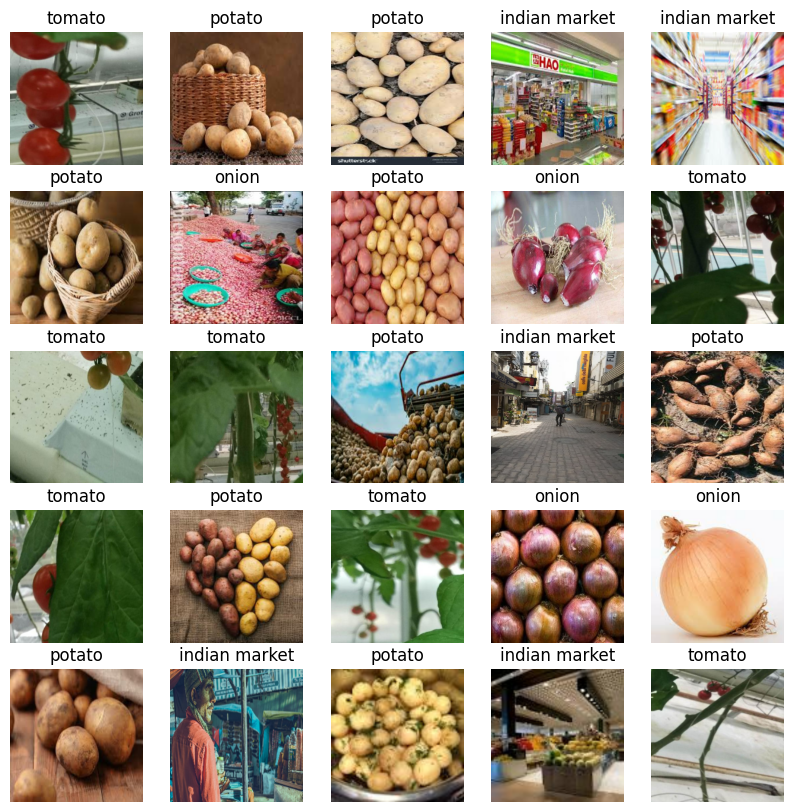

In [23]:
# Get one batch
image_batch, label_batch = next(iter(train_ds_batch))

def show_batch(image_batch, label_batch, class_names):
    plt.figure(figsize=(10, 10))
    batch_size = image_batch.shape[0]
    #print(batch_size)
    for n in range(min(25, batch_size)):
        ax = plt.subplot(5, 5, n + 1)
        image = image_batch[n]
        plt.imshow(image)
        plt.title(class_names[label_batch[n].numpy()])  # Use class names dynamically
        plt.axis("off")

# Call function with class names
show_batch(image_batch, label_batch, CLASS_NAMES)

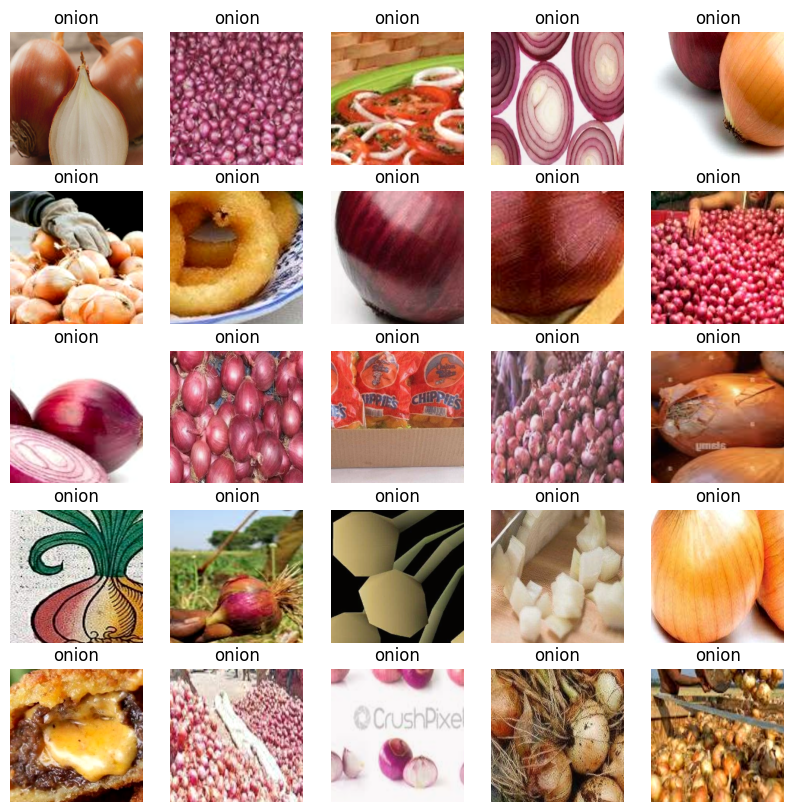

In [24]:
## Augmented Images
image_batch, label_batch = next(iter(balanced_augmented_ds.batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)))

show_batch(image_batch, label_batch, CLASS_NAMES)


In [25]:
NUM_CLASSES = len(CLASS_NAMES)
train_ds_batch = train_ds_batch.map(lambda x, y: (x, tf.one_hot(y, depth=NUM_CLASSES)))
val_ds_batch = val_ds_batch.map(lambda x, y: (x, tf.one_hot(y, depth=NUM_CLASSES)))


In [26]:
# Check one sample
for img, label in train_ds_batch.take(1):
    print("Image shape:", img.shape)
    print("Label:", label.numpy())

Image shape: (128, 224, 224, 3)
Label: [[0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 

#### Training

In [27]:
from tensorflow.keras.applications import VGG16, ResNet50, MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization, Activation, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard, Callback
from sklearn.utils.class_weight import compute_class_weight
from datetime import datetime


EPOCHS = 10
path_to_add = "./checkpoints"

class_weights_dict = class_weights #{class_to_idx[i]: class_weights[i] for i in CLASS_NAMES}

class LogMetricsCallback(Callback):
    def on_train_end(self, logs=None):
        print("\nMetrics at the end of this trial:")
        print(logs)



In [28]:
def create_model(base_model):
    """Create a fine-tuned model by removing the top layer and adding a new Dense layer."""
    with strategy.scope():
      cloned_model = tf.keras.models.clone_model(base_model)
      cloned_model.set_weights(base_model.get_weights())
      cloned_model.trainable = False  # Freeze base layers

      # Verify that weights are retained in cloned model
      for layer_original, layer_clone in zip(base_model.layers, cloned_model.layers):
          original_weights = layer_original.get_weights()
          cloned_weights = layer_clone.get_weights()

          if len(original_weights) != len(cloned_weights) or not all(
              np.array_equal(ow, cw) for ow, cw in zip(original_weights, cloned_weights)
          ):
              print(f"Weights do not match for layer {layer_original.name} ❌")
          else:
              print(f"Weights match for layer {layer_original.name} ✅")

      x = cloned_model.output
      x = GlobalAveragePooling2D()(x)  # Reduce feature maps
      #x = Dense(256, activation='relu')(x)
      #x = BatchNormalization()(x)  # Normalize activations #commenting this out - not much data to train this many parameters
      #x = Activation('relu')(x)  # ReLU activation
      x = Dropout(0.08)(x)  # Prevent overfitting

      x = Dense(NUM_CLASSES, activation='softmax')(x)  # Output layer

      model = Model(inputs=cloned_model.input, outputs=x)

      model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy', tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')])
    return model

# Define AlexNet architecture from scratch
def create_alexnet():
    """Create an AlexNet-style CNN from scratch."""
    with strategy.scope():
      model = Sequential([
        Conv2D(96, (11, 11), strides=4, activation='relu', input_shape=(224, 224, 3)),
        MaxPooling2D((3, 3), strides=2),

        Conv2D(256, (5, 5), padding="same", activation='relu'),
        MaxPooling2D((3, 3), strides=2),

        Conv2D(384, (3, 3), padding="same", activation='relu'),
        Conv2D(384, (3, 3), padding="same", activation='relu'),
        Conv2D(256, (3, 3), padding="same", activation='relu'),
        MaxPooling2D((3, 3), strides=2),

        Flatten(),
        Dense(4096,activation='relu'),
        Dropout(0.1),
        Dense(4096,activation='relu'),
        Dropout(0.1),
        Dense(NUM_CLASSES, activation='softmax')  # Output layer
        ])

      model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy', tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')])
    return model

In [29]:
models = {
    'VGG16': VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    'ResNet50': ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    'MobileNetV2': MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    'AlexNet': None  # Placeholder, as we are not using a pre-trained base
}

history_dict = {}

for name, base_model in models.items():
    print(f"Training {name}...")

    log_dir = f"./{name}_tensorboard/logs/fit/{datetime.now().strftime('%Y%m%d-%H%M%S')}"
    dir_paths=[f"./{name}_tensorboard",f"./{name}_best_model"]
    for dir_path in dir_paths:
      if os.path.exists(dir_path):
          shutil.rmtree(dir_path)  # Deletes the entire directory and its contents
          print(f"Deleted: {dir_path}")
      else:
          print(f"Directory does not exist: {dir_path}")

    callbacks = [
          EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True),
          ModelCheckpoint(f"./{name}_best_model/best_model.keras", save_best_only=True, monitor='val_loss',mode='min'),
          ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=1e-6),
          TensorBoard(log_dir=log_dir, histogram_freq=1),
          LogMetricsCallback()
      ]
    if name == "AlexNet":
        model = create_alexnet()
    else:
        model = create_model(base_model)

    display(model.summary())
    history = model.fit(
        train_ds_batch,
        validation_data=val_ds_batch,
        epochs=EPOCHS,
        #class_weight=class_weights_dict,
        callbacks=callbacks
    )

    history_dict[name] = history.history  # Store training history


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Training VGG16...
Directory does not exist: ./VGG16_tensorboard
Directory does not exist: ./VGG16_best_model
Weights match for layer input_layer ✅
Weights match for layer block1_conv1 ✅
Weights match for layer block1_conv2 ✅
Weights match for layer block1_pool ✅
Weights match for layer block2_conv1 ✅
Weights match for layer block2_conv2 ✅
Weights match for layer block2_pool ✅
Weights match for layer block3_conv1 ✅
Weights match for layer block3_conv2 ✅
Weights match for layer block3_conv3 ✅
Weights match for layer block3_pool ✅
Weights match for layer block4_conv1 ✅
Weights match for layer block4_conv2 ✅
Weights match for layer block4_conv3 ✅
Weights match for layer block4_pool ✅
Weights match for layer block5_conv1 ✅
Weights match for layer block5_conv2 ✅
Weights match for layer block5_conv3 ✅
Weights match for layer block5_pool ✅


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ keras_tensor (InputLayer)            │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │              

 Total params: 14,716,740 (56.14 MB)

 Trainable params: 2,052 (8.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

None

Epoch 1/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.2668 - loss: 1.4275 - precision: 1.0000 - recall: 0.0069 - val_accuracy: 0.3675 - val_loss: 1.3202 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 12s 496ms/step - accuracy: 0.3192 - loss: 1.3595 - precision: 4.0343e-08 - recall: 2.7578e-10 - val_accuracy: 0.4318 - val_loss: 1.2988 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 12s 489ms/step - accuracy: 0.3909 - loss: 1.3428 - precision: 0.5075 - recall: 0.0071 - val_accuracy: 0.4522 - val_loss: 1.2713 - val_precision: 1.0000 - val_recall: 8.5454e-04 - learning_rate: 1.0000e-04
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 12s 506ms/step - accuracy: 0.3732 - loss: 1.3357 - precision: 0.1162 - recall: 1.1378e-04 - val_accuracy: 0.5290 - val_loss: 1.2628 - val_precision: 1.0000 - val_recall: 1.6690e-06 - learning_rate: 1.0000e-04
Epoch 5/10


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ keras_tensor_19           │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ keras_tensor_19[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 23,595,908 (90.01 MB)

 Trainable params: 8,196 (32.02 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

None

Epoch 1/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.3054 - loss: 1.4945 - precision: 0.3185 - recall: 0.2042 - val_accuracy: 0.2705 - val_loss: 1.3992 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 727ms/step - accuracy: 0.3011 - loss: 1.3609 - precision: 5.9212e-16 - recall: 1.5441e-23 - val_accuracy: 0.3643 - val_loss: 1.3535 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 18s 750ms/step - accuracy: 0.2437 - loss: 1.3845 - precision: 4.8283e-17 - recall: 9.9018e-19 - val_accuracy: 0.3873 - val_loss: 1.3534 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 714ms/step - accuracy: 0.3166 - loss: 1.3740 - precision: 0.0425 - recall: 3.0561e-04 - val_accuracy: 0.4861 - val_loss: 1.3388 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ keras_tensor_194          │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ keras_tensor_194[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├──────────────────────

 Total params: 2,263,108 (8.63 MB)

 Trainable params: 5,124 (20.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

None

Epoch 1/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.3152 - loss: 1.5274 - precision: 0.4020 - recall: 0.2017 - val_accuracy: 0.5053 - val_loss: 1.0973 - val_precision: 0.6670 - val_recall: 0.3036 - learning_rate: 1.0000e-04
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 403ms/step - accuracy: 0.5293 - loss: 1.1152 - precision: 0.6508 - recall: 0.3270 - val_accuracy: 0.6506 - val_loss: 0.9131 - val_precision: 0.7385 - val_recall: 0.4450 - learning_rate: 1.0000e-04
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 10s 403ms/step - accuracy: 0.6486 - loss: 0.9564 - precision: 0.7837 - recall: 0.4149 - val_accuracy: 0.7403 - val_loss: 0.7642 - val_precision: 0.8292 - val_recall: 0.5944 - learning_rate: 1.0000e-04
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 10s 412ms/step - accuracy: 0.6965 - loss: 0.8235 - precision: 0.7903 - recall: 0.5327 - val_accuracy: 0.7740 - val_loss: 0.6429 - val_precision: 0.8867 - val_recall: 0.6863 - learning_rate: 1.0000e-04
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 10s 390ms

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 54, 54, 96)          │          34,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 26, 26, 96)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 26, 26, 256)         │         614,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 12, 12, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 12, 12, 384)         │         885,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 12, 12, 384)         │       1,327,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 12, 12, 256)         │         884,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 5, 5, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6400)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 4096)                │      26,218,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 4096)                │      16,781,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 4)                   │          16,388 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 46,763,396 (178.39 MB)

 Trainable params: 46,763,396 (178.39 MB)

 Non-trainable params: 0 (0.00 B)

None

Epoch 1/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.2545 - loss: 1.3856 - precision: 0.3830 - recall: 9.2547e-11 - val_accuracy: 0.5757 - val_loss: 0.8963 - val_precision: 0.6301 - val_recall: 0.4242 - learning_rate: 1.0000e-04
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 0.5157 - loss: 0.9990 - precision: 0.6392 - recall: 0.3809 - val_accuracy: 0.7243 - val_loss: 0.6738 - val_precision: 0.7922 - val_recall: 0.6961 - learning_rate: 1.0000e-04
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 0.7252 - loss: 0.6594 - precision: 0.7665 - recall: 0.6342 - val_accuracy: 0.7838 - val_loss: 0.5159 - val_precision: 0.8294 - val_recall: 0.7401 - learning_rate: 1.0000e-04
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 23s 997ms/step - accuracy: 0.8209 - loss: 0.4886 - precision: 0.8597 - recall: 0.7522 - val_accuracy: 0.7380 - val_loss: 0.6282 - val_precision: 0.7752 - val_recall: 0.6940 - learning_rate: 1.0000e-04
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step

### Model Evaluation

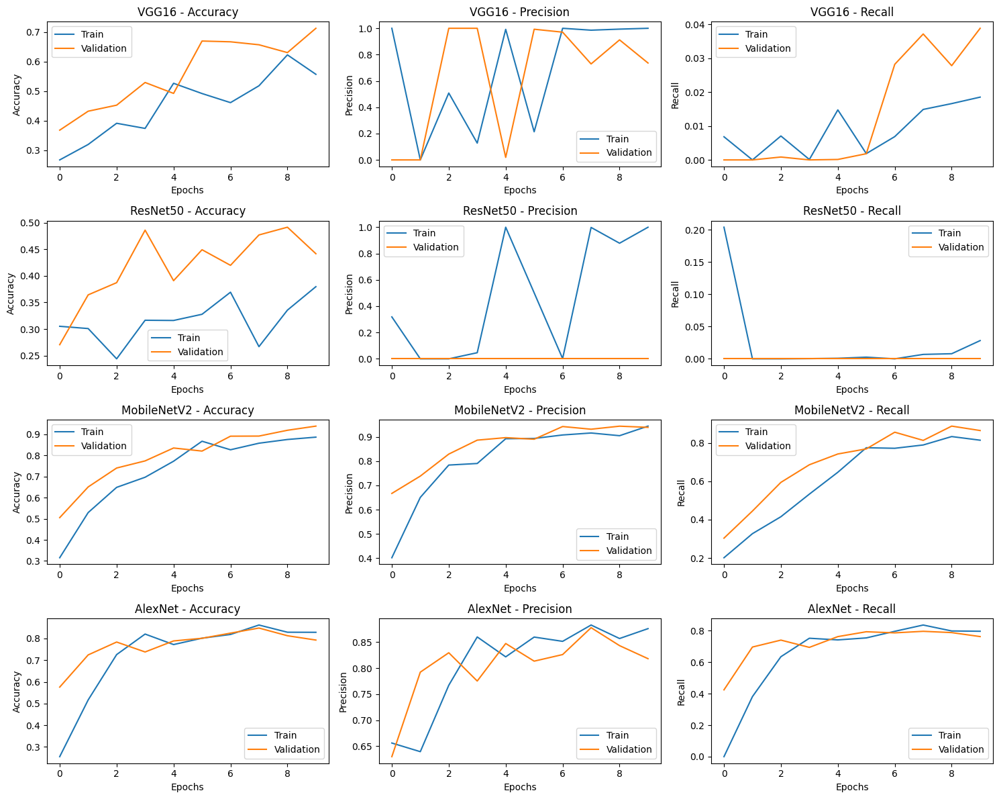

In [30]:
fig, axes = plt.subplots(4, 3, figsize=(15, 12))  # 4 Rows (Models) × 3 Cols (Metrics)
metrics = ['accuracy', 'precision', 'recall']
model_names = list(models.keys())

for row, model_name in enumerate(model_names):
    history = history_dict[model_name]

    for col, metric in enumerate(metrics):
        ax = axes[row, col]
        for key in history:
          if metric==key:
            break
          if metric in key.split('_'):
            metric='_'.join(key.split('_')[-2:])

        ax.plot(history[metric], label='Train')
        ax.plot(history[f'val_{metric}'], label='Validation')
        ax.set_title(f'{model_name} - {metric.capitalize()}')
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric.capitalize())
        ax.legend()

plt.tight_layout()
plt.show()

In [31]:
# for x, y in train_ds_batch.take(1):
#     print("Train batch shape:", x.shape, y.shape)

# for x, y in val_ds_batch.take(1):
#     print("Validation batch shape:", x.shape, y.shape)

In [32]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix
from tensorflow.keras.models import load_model

# Define model paths
model_paths = {
    "VGG16": "VGG16_best_model/best_model.keras",
    "ResNet50": "ResNet50_best_model/best_model.keras",
    "MobileNetV2": "MobileNetV2_best_model/best_model.keras",
    "AlexNet": "AlexNet_best_model/best_model.keras"
}

class_names = CLASS_NAMES

for model_name, model_path in model_paths.items():
    print(f"\nEvaluating {model_name}...\n")

    # Load the trained model
    model = load_model(model_path)

    # Initialize lists for metrics
    y_true, y_pred, y_probs, sample_images = [], [], [], []

    # Loop over batches
    for x_batch, y_batch in test_ds_batch:
        preds = model.predict(x_batch)  # Probabilities
        y_probs.extend(tf.nn.softmax(preds).numpy())  # Convert logits to probabilities
        y_true.extend(y_batch.numpy())  # True labels
        y_pred.extend(tf.argmax(preds, axis=1).numpy())  # Predicted class
        sample_images.extend(x_batch.numpy())  # Store images for visualization

    # Convert lists to numpy arrays
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_probs = np.array(y_probs)  # Shape: (num_samples, num_classes)

    # Compute Metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average="weighted")
    recall = recall_score(y_true, y_pred, average="weighted")

    print(f"Test Accuracy: {accuracy:.4f}")
    print(f"Test Precision: {precision:.4f}")
    print(f"Test Recall: {recall:.4f}")

    # ---- 5x5 Grid Visualization ----
    fig, axes = plt.subplots(5, 5, figsize=(12, 12))
    fig.suptitle(f"{model_name} - Predictions", fontsize=16)

    for i, ax in enumerate(axes.flat):
        if i >= len(sample_images):
            break  # Stop if there are fewer than 25 images

        img = sample_images[i]
        true_label = class_names[y_true[i]]
        pred_label = class_names[y_pred[i]]
        class_probs = y_probs[i]

        prob_text = "\n".join([f"{class_names[j]}: {class_probs[j]:.2f}" for j in range(NUM_CLASSES)])
        title_text = f"True: {true_label} | Pred: {pred_label}\n{prob_text}"

        ax.imshow(img)
        ax.axis("off")
        ax.set_title(title_text, fontsize=8)

    plt.tight_layout()
    plt.show()

    # ---- Confusion Matrix ----
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix - {model_name}")
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

#### Model Interpretability

In [33]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=c3e6de410d03334ae844891e27b74739e4e215c8e71c32ffbc3574db3719f652
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [34]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
from lime.wrappers.scikit_image import SegmentationAlgorithm
from tensorflow.keras.models import load_model

# Load model
model = load_model(model_paths["MobileNetV2"])

# Define LIME Explainer & Segmentation Algorithm
explainer = lime_image.LimeImageExplainer()
segmenter = SegmentationAlgorithm('quickshift', kernel_size=10, max_dist=300, ratio=0.5)

# kernel_size=10 → Larger kernel means bigger superpixels.
# max_dist=300 → Increases the spatial reach of segmentation.
# ratio=0.5 → Controls the balance between color similarity and spatial distance (higher means more merging).

# Select 2 images per class
num_classes = 4
num_samples = 2
samples_per_class = {i: [] for i in range(num_classes)}

for x, y in test_ds:
    class_label = int(y.numpy())
    if len(samples_per_class[class_label]) < num_samples:
        samples_per_class[class_label].append(x.numpy())
    if all(len(v) == num_samples for v in samples_per_class.values()):
        break

# Function to predict grayscale images (if needed)
def predict_on_color(img):
    gray_img = np.mean(img, axis=-1, keepdims=True)  # Convert to grayscale
    return model.predict(gray_img, verbose=0)

# Run LIME for each class
for class_label, images in samples_per_class.items():
    for i, img in enumerate(images):
        explanation = explainer.explain_instance(
            img,
            classifier_fn=model.predict,  # Use function for grayscale conversion
            top_labels=1,
            hide_color=0,
            num_samples=1000,
            segmentation_fn=segmenter
        )

        # Get explanation mask for positive regions
        temp, mask = explanation.get_image_and_mask(
            explanation.top_labels[0],  # Get mask for top predicted class
            positive_only=True,  # Get mask for top predicted class
            num_features=5, # Highlight 5 most important superpixels
            hide_rest=False, # Show the entire image
            min_weight=0.01 # Filter out weak contributions
        )
        predicted_class = idx_to_class[explanation.top_labels[0]]

        # Get explanation mask for both positive and negative regions
        temp2, mask2 = explanation.get_image_and_mask(
            explanation.top_labels[0],
            positive_only=False,
            num_features=5,
            hide_rest=False,
            min_weight=0.01
        )

        # Plot results
        fig, axes = plt.subplots(1, 3, figsize=(12, 5))
        axes[0].imshow(img)
        axes[0].axis("off")
        axes[0].set_title(f"Original - Class {idx_to_class[class_label]}")

        axes[1].imshow(mark_boundaries(temp, mask))
        axes[1].axis("off")
        axes[1].set_title(f"Positive Regions")

        axes[2].imshow(mark_boundaries(temp2, mask2))
        axes[2].axis("off")
        axes[2].set_title(f"Positive/Negative Regions - Predicted Class {predicted_class}")
        ## positives highlighted as green and negatives as red
        plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [35]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2

from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model

# Load model
model = load_model(model_paths["MobileNetV2"])

# Function to compute Grad-CAM heatmap
def compute_gradcam(img, model, layer_name="Conv_1"):
    img_tensor = tf.convert_to_tensor(img, dtype=tf.float32)
    img_tensor = tf.expand_dims(img_tensor, axis=0)  # Add batch dimension

    grad_model = Model(inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output])

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(img_tensor)
        top_pred_index = tf.argmax(predictions[0])  # Get top predicted class
        class_channel = predictions[:, top_pred_index]

    # Compute gradients
    grads = tape.gradient(class_channel, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Apply weighted sum of activations
    conv_output = conv_output[0]
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_output), axis=-1)

    # Normalize heatmap
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    return heatmap, int(top_pred_index)

# Function to overlay heatmap on image
def overlay_heatmap(img, heatmap, alpha=0.6):
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))  # Resize to image shape
    heatmap = np.uint8(255 * heatmap)  # Convert to 0-255 scale
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)  # Apply color map

    # Blend with original image
    superimposed_img = cv2.addWeighted(heatmap, alpha, np.uint8(img * 255), 1 - alpha, 0)
    return superimposed_img

# Select 2 images per class
num_classes = 4
num_samples = 2
samples_per_class = {i: [] for i in range(num_classes)}

for x, y in test_ds:
    class_label = int(y.numpy())
    if len(samples_per_class[class_label]) < num_samples:
        samples_per_class[class_label].append(x.numpy())
    if all(len(v) == num_samples for v in samples_per_class.values()):
        break

# Run Grad-CAM for each class
for class_label, images in samples_per_class.items():
    for i, img in enumerate(images):
        heatmap, predicted_label = compute_gradcam(img, model, layer_name="Conv_1")
        superimposed_img = overlay_heatmap(img, heatmap)

        predicted_class = idx_to_class[predicted_label]

        # Plot results
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(img)
        axes[0].axis("off")
        axes[0].set_title(f"Original - Class {idx_to_class[class_label]}")

        axes[1].imshow(superimposed_img)
        axes[1].axis("off")
        axes[1].set_title(f"Grad-CAM - Predicted Class {predicted_class}")

        plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [35]:
## MobileNet works well here

In [37]:
%load_ext tensorboard
%tensorboard --logdir MobileNetV2_tensorboard/logs/fit

Output hidden; open in https://colab.research.google.com to view.

## Insights & Recommendations  

### 🔍 **Key Observations:**  
1. **Tomato images had the highest accuracy** compared to other classes, indicating a bias in generalization.  
2. **Image format distribution is uneven:**  
   - **Tomato images** were predominantly in `.png` format (high quality, lossless).  
   - **Other classes** were mostly in `.jpeg/.jpg` (compressed, lossy).  
3. **Image size distribution is imbalanced:**  
   - **Tomato images were larger (400x600 and above),** preserving more details.  
   - **Other classes had more small-sized images (0-200 x 200-400),** which may have lost details during resizing.  
4. **AlexNet trained from scratch performed well** because it learned domain-specific features.  
5. **Pre-trained models (VGG/ResNet) struggled,** likely due to feature mismatches with ImageNet-trained filters.  
6. **MobileNet performed better than VGG/ResNet** due to its efficient feature extraction and ability to generalize with fewer parameters and smaller dataset.  

### ✅ **Recommendations for Improvement:**  
1. **Standardize Image Format:** Convert all images to `.png` before training to eliminate compression-related biases.   
2. **Fine-Tune Transfer Learning Models:**  
   - Unfreeze **more layers** (top 10-15) instead of training only the Softmax layer.  
   - Use a **lower learning rate (e.g., 1e-4)** for gradual adaptation. More to train on
3. **Experiment with Data Augmentation:**  
   - Apply **upsampling for small images** to retain important features.  
   - Use **contrast enhancement** to compensate for image quality variations.  

---